In [1]:
import kagglehub

# Download latest version
path = kagglehub.dataset_download("olistbr/brazilian-ecommerce")

print("Path to dataset files:", path)

Path to dataset files: /kaggle/input/brazilian-ecommerce


--- [0/8] Installing libraries and importing modules ---
Setup complete.

--- [1/8] Preprocessing: Loading and Merging E-commerce Data ---

Preprocessing complete. Working with 112650 line items.

--- [2/8] GNN Training & Validation ---
Graph constructed with 131466 nodes and 136435 edges.
Using device: cuda
  GNN Training Epoch: 020, Loss: 0.5840
  GNN Training Epoch: 040, Loss: 0.5700
  GNN Training Epoch: 060, Loss: 0.5597
  GNN Training Epoch: 080, Loss: 0.5462
  GNN Training Epoch: 100, Loss: 0.5336
GNN training complete.


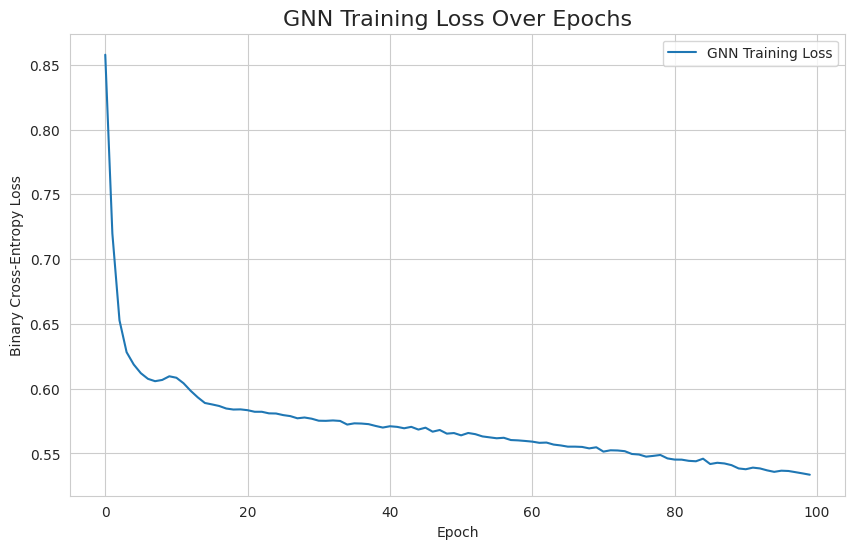


--- [3/8] Integrating Features and Training Anomaly Detector ---
Final integrated feature set created with 101 features.


/usr/local/lib/python3.11/dist-packages/sklearn/base.py:439: UserWarning:

X does not have valid feature names, but IsolationForest was fitted with feature names



Anomaly detection complete.

--- [4/8] Performing Quantitative Model Evaluations ---
Surrogate Model Accuracy: 1.0000

Classification Report for Surrogate Model:
              precision    recall  f1-score   support

     Anomaly       1.00      1.00      1.00      1102
      Normal       1.00      1.00      1.00    109078

    accuracy                           1.00    110180
   macro avg       1.00      1.00      1.00    110180
weighted avg       1.00      1.00      1.00    110180


--- [5/8] Generating Explainable AI (XAI) Insights with SHAP ---


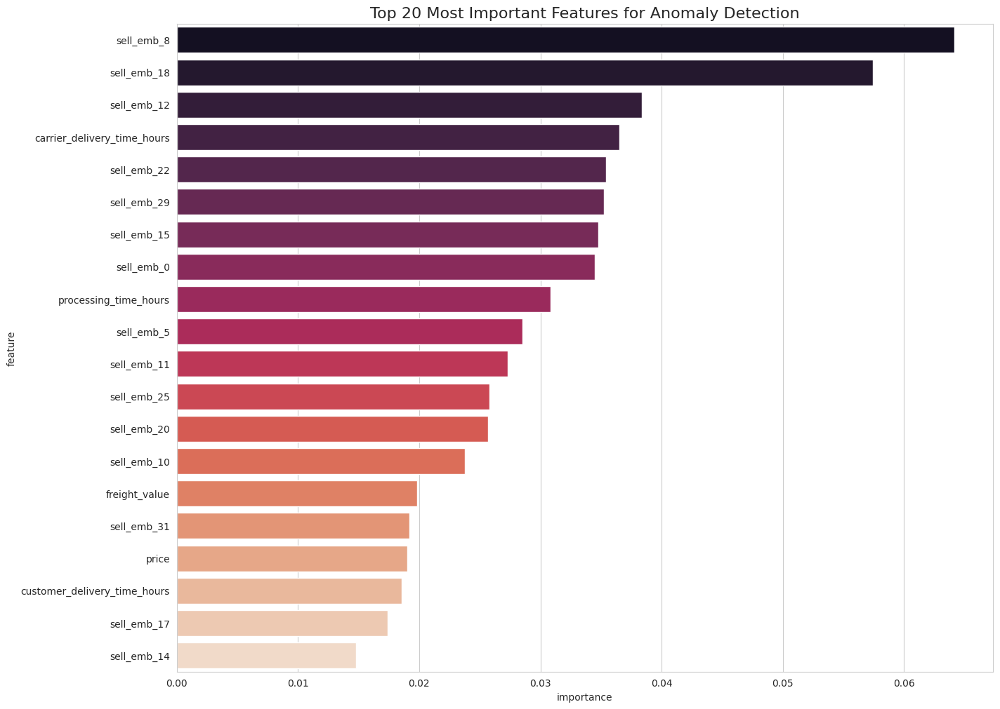


--- SHAP Summary Plot ---


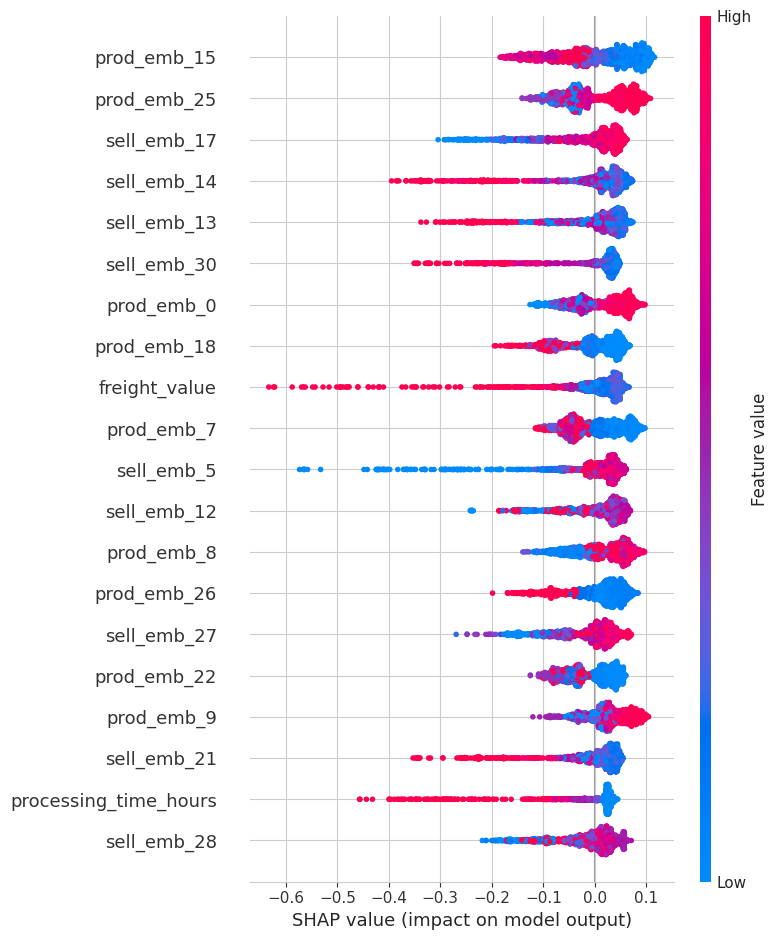


--- [6/8] Visualizing GNN Learned Embeddings ---


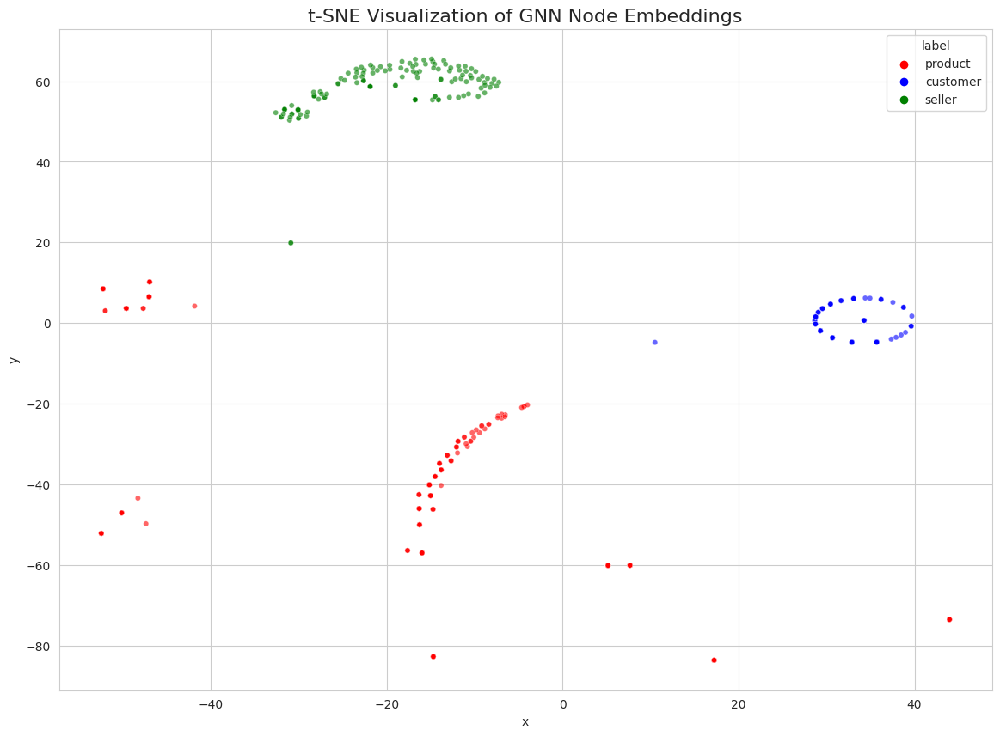


--- [7/8] Generating Operational Dashboards ---


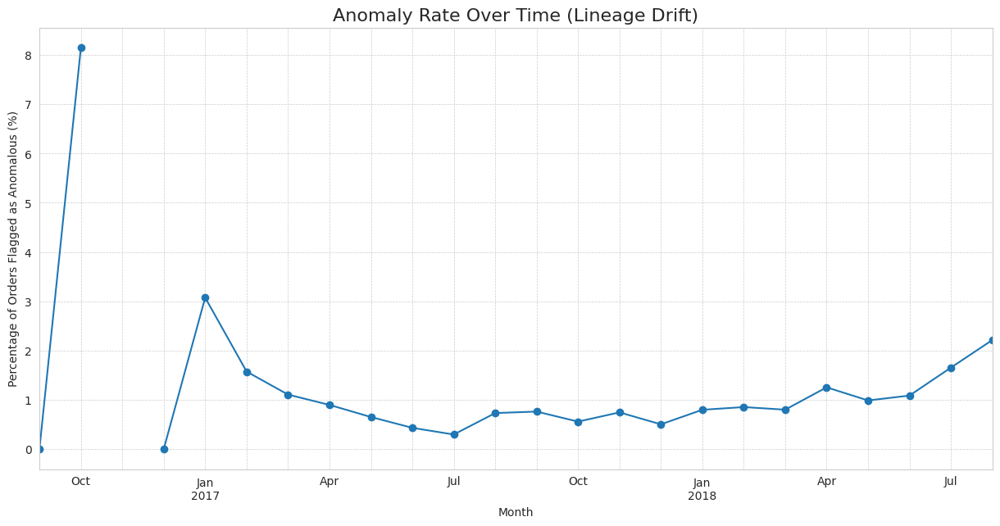

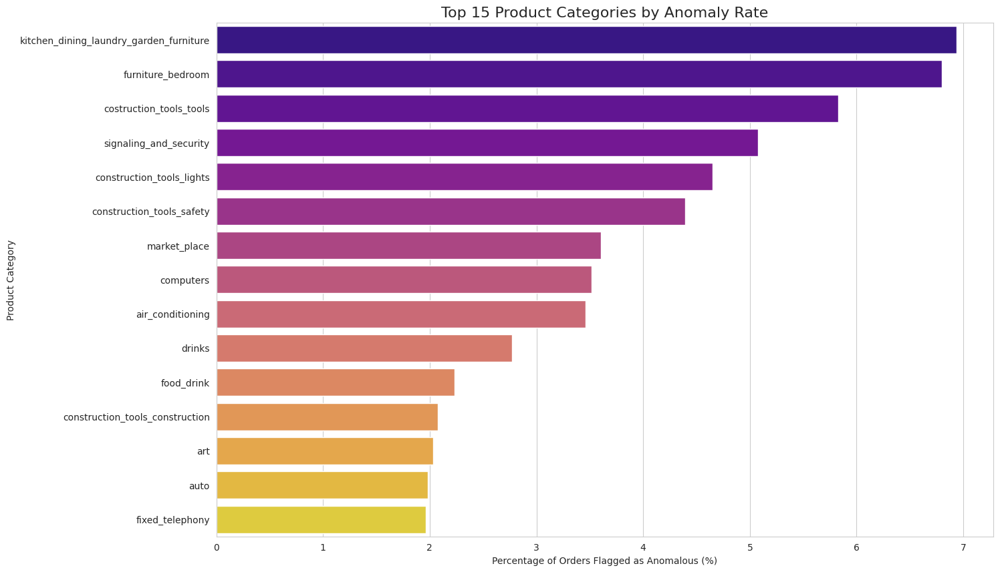


--- [8/8] The Proof: Interactive Anomaly Score Visualization ---



--- FULL ANALYSIS COMPLETE ---


In [8]:
# ==============================================================================
# STAGE 0: SETUP AND IMPORTS
# ==============================================================================
print("--- [0/8] Installing libraries and importing modules ---")
# Using -q for a quieter installation
!pip install -q torch torch_geometric shap pyvis geopandas

import pandas as pd
import numpy as np
import os
import networkx as nx
import torch
from torch.utils.data import DataLoader, TensorDataset
import torch.nn as nn
from torch_geometric.data import Data
from torch_geometric.nn import GATConv
from torch_geometric.utils import negative_sampling
import torch.nn.functional as F
from sklearn.preprocessing import MinMaxScaler
from sklearn.ensemble import IsolationForest, RandomForestClassifier
from sklearn.model_selection import train_test_split
from sklearn.metrics import (
    classification_report, roc_auc_score, confusion_matrix, roc_curve,
    precision_recall_curve, average_precision_score, silhouette_score, accuracy_score,
    ConfusionMatrixDisplay
)
from sklearn.manifold import TSNE
from sklearn.decomposition import PCA
from sklearn.metrics.pairwise import cosine_similarity
from pyvis.network import Network
import matplotlib.pyplot as plt
import seaborn as sns
import shap
import random
import plotly.express as px

# Set a professional plot style for all visualizations
sns.set_style("whitegrid")
print("Setup complete.")

# ==============================================================================
# STAGE 1: DATA LOADING AND PREPROCESSING
# ==============================================================================
print("\n--- [1/8] Preprocessing: Loading and Merging E-commerce Data ---")

base_path = '/kaggle/input/brazilian-ecommerce/'
customers_df = pd.read_csv(os.path.join(base_path, 'olist_customers_dataset.csv'))
orders_df = pd.read_csv(os.path.join(base_path, 'olist_orders_dataset.csv'))
order_items_df = pd.read_csv(os.path.join(base_path, 'olist_order_items_dataset.csv'))
products_df = pd.read_csv(os.path.join(base_path, 'olist_products_dataset.csv'))
category_translation = pd.read_csv(os.path.join(base_path, 'product_category_name_translation.csv'))

order_customer_df = pd.merge(orders_df, customers_df, on='customer_id')
full_df = pd.merge(order_customer_df, order_items_df, on='order_id')
full_df = pd.merge(full_df, products_df, on='product_id', how='left')
full_df = pd.merge(full_df, category_translation, on='product_category_name', how='left')

timestamp_cols = [
    'order_purchase_timestamp', 'order_approved_at', 'order_delivered_carrier_date',
    'order_delivered_customer_date', 'order_estimated_delivery_date', 'shipping_limit_date'
]
for col in timestamp_cols:
    full_df[col] = pd.to_datetime(full_df[col], errors='coerce')

full_df['processing_time_hours'] = (full_df['order_approved_at'] - full_df['order_purchase_timestamp']).dt.total_seconds() / 3600
full_df['carrier_delivery_time_hours'] = (full_df['order_delivered_carrier_date'] - full_df['order_approved_at']).dt.total_seconds() / 3600
full_df['customer_delivery_time_hours'] = (full_df['order_delivered_customer_date'] - full_df['order_delivered_carrier_date']).dt.total_seconds() / 3600
full_df['total_delivery_time_hours'] = (full_df['order_delivered_customer_date'] - full_df['order_purchase_timestamp']).dt.total_seconds() / 3600
print(f"\nPreprocessing complete. Working with {len(full_df)} line items.")

# ==============================================================================
# STAGE 2: GRAPH CONSTRUCTION AND GNN TRAINING
# ==============================================================================
print("\n--- [2/8] GNN Training & Validation ---")

G = nx.DiGraph()
for customer in full_df['customer_unique_id'].unique(): G.add_node(customer, type='customer')
for seller in full_df['seller_id'].unique(): G.add_node(seller, type='seller')
for product in full_df['product_id'].unique(): G.add_node(product, type='product')
for index, row in full_df.iterrows():
    G.add_edge(row['customer_unique_id'], row['product_id'])
    G.add_edge(row['product_id'], row['seller_id'])
print(f"Graph constructed with {G.number_of_nodes()} nodes and {G.number_of_edges()} edges.")

all_nodes = list(G.nodes())
node_to_int = {node: i for i, node in enumerate(all_nodes)}
node_type_map = {'customer': [1, 0, 0], 'seller': [0, 1, 0], 'product': [0, 0, 1]}
x = torch.tensor([node_type_map[G.nodes[node]['type']] for node in all_nodes], dtype=torch.float)
source_nodes = [node_to_int[u] for u, v in G.edges()]
target_nodes = [node_to_int[v] for u, v in G.edges()]
edge_index = torch.tensor([source_nodes, target_nodes], dtype=torch.long)
pyg_data = Data(x=x, edge_index=edge_index)

class GAT(torch.nn.Module):
    def __init__(self, in_channels, hidden_channels, out_channels):
        super().__init__()
        self.conv1 = GATConv(in_channels, hidden_channels, heads=4)
        self.conv2 = GATConv(hidden_channels * 4, out_channels, heads=1)
    def forward(self, x, edge_index):
        x = F.dropout(x, p=0.6, training=self.training)
        x = F.elu(self.conv1(x, edge_index))
        x = F.dropout(x, p=0.6, training=self.training)
        x = self.conv2(x, edge_index)
        return x

device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
print(f"Using device: {device}")
pyg_data = pyg_data.to(device)
model_gat = GAT(in_channels=pyg_data.num_node_features, hidden_channels=16, out_channels=32).to(device)
optimizer_gat = torch.optim.Adam(model_gat.parameters(), lr=0.005, weight_decay=5e-4)

gnn_losses = []
for epoch in range(1, 101):
    model_gat.train()
    optimizer_gat.zero_grad()
    z = model_gat(pyg_data.x, pyg_data.edge_index)
    neg_edge_index = negative_sampling(edge_index=pyg_data.edge_index, num_nodes=pyg_data.num_nodes, num_neg_samples=pyg_data.edge_index.size(1) // 2)
    edge_label_index = torch.cat([pyg_data.edge_index, neg_edge_index], dim=-1)
    edge_label = torch.cat([torch.ones(pyg_data.edge_index.size(1)), torch.zeros(neg_edge_index.size(1))]).to(device)
    out = (z[edge_label_index[0]] * z[edge_label_index[1]]).sum(dim=-1)
    loss = F.binary_cross_entropy_with_logits(out, edge_label)
    loss.backward()
    optimizer_gat.step()
    gnn_losses.append(loss.item())
    if epoch % 20 == 0:
        print(f'  GNN Training Epoch: {epoch:03d}, Loss: {loss:.4f}')

model_gat.eval()
with torch.no_grad():
    final_embeddings = model_gat(pyg_data.x, pyg_data.edge_index).cpu().numpy()
print("GNN training complete.")

plt.figure(figsize=(10, 6))
plt.plot(gnn_losses, label="GNN Training Loss")
plt.title("GNN Training Loss Over Epochs", fontsize=16)
plt.xlabel("Epoch")
plt.ylabel("Binary Cross-Entropy Loss")
plt.legend()
plt.grid(True)
plt.show()

# ==============================================================================
# STAGE 3: FEATURE INTEGRATION AND ANOMALY DETECTION
# ==============================================================================
print("\n--- [3/8] Integrating Features and Training Anomaly Detector ---")

embedding_dict = {node: final_embeddings[i] for node, i in node_to_int.items()}
full_df['customer_embedding'] = full_df['customer_unique_id'].map(embedding_dict)
full_df['seller_embedding'] = full_df['seller_id'].map(embedding_dict)
full_df['product_embedding'] = full_df['product_id'].map(embedding_dict)

features_to_analyze = ['processing_time_hours', 'carrier_delivery_time_hours', 'customer_delivery_time_hours', 'price', 'freight_value']
temporal_features = full_df[features_to_analyze].dropna()
embedding_features = full_df.loc[temporal_features.index]

customer_embed_df = pd.DataFrame(embedding_features['customer_embedding'].tolist(), index=temporal_features.index).add_prefix('cust_emb_')
seller_embed_df = pd.DataFrame(embedding_features['seller_embedding'].tolist(), index=temporal_features.index).add_prefix('sell_emb_')
product_embed_df = pd.DataFrame(embedding_features['product_embedding'].tolist(), index=temporal_features.index).add_prefix('prod_emb_')

final_feature_df = pd.concat([temporal_features, customer_embed_df, seller_embed_df, product_embed_df], axis=1)
final_feature_df.dropna(inplace=True)
print(f"Final integrated feature set created with {final_feature_df.shape[1]} features.")

final_model = IsolationForest(n_estimators=100, contamination=0.01, random_state=42, n_jobs=-1)
final_model.fit(final_feature_df)
final_feature_df['anomaly_score'] = final_model.decision_function(final_feature_df)
final_feature_df['is_anomaly'] = final_model.predict(final_feature_df.drop('anomaly_score', axis=1))
final_feature_df['is_anomaly'] = final_feature_df['is_anomaly'].map({1: 'Normal', -1: 'Anomaly'})
print("Anomaly detection complete.")

# ==============================================================================
# STAGE 4: QUANTITATIVE MODEL EVALUATION
# ==============================================================================
print("\n--- [4/8] Performing Quantitative Model Evaluations ---")

X = final_feature_df.drop(['anomaly_score', 'is_anomaly'], axis=1)
y = final_feature_df['is_anomaly']
surrogate_model = RandomForestClassifier(n_estimators=100, random_state=42, n_jobs=-1)
surrogate_model.fit(X, y)
y_pred = surrogate_model.predict(X)
y_proba = surrogate_model.predict_proba(X)[:, 1]
y_binary = y.map({'Normal': 0, 'Anomaly': 1})

print(f"Surrogate Model Accuracy: {accuracy_score(y, y_pred):.4f}")
print("\nClassification Report for Surrogate Model:")
print(classification_report(y, y_pred))


# ==============================================================================
# STAGE 5: EXPLAINABLE AI (XAI) ANALYSIS
# ==============================================================================
print("\n--- [5/8] Generating Explainable AI (XAI) Insights with SHAP ---")

importances = surrogate_model.feature_importances_
feature_names = X.columns
importance_df = pd.DataFrame({'feature': feature_names, 'importance': importances}).sort_values(by='importance', ascending=False)
plt.figure(figsize=(15, 12))
sns.barplot(x='importance', y='feature', data=importance_df.head(20), palette='rocket')
plt.title('Top 20 Most Important Features for Anomaly Detection', fontsize=16)
plt.show()

explainer = shap.TreeExplainer(final_model)
shap_sample = X.sample(min(2000, len(X)), random_state=42)
shap_values = explainer.shap_values(shap_sample)
print("\n--- SHAP Summary Plot ---")
shap.summary_plot(shap_values, shap_sample, plot_type="dot", show=True)

# ==============================================================================
# STAGE 6: GNN EMBEDDING VISUALIZATIONS
# ==============================================================================
print("\n--- [6/8] Visualizing GNN Learned Embeddings ---")

num_samples = min(5000, len(all_nodes))
sample_indices = random.sample(range(len(all_nodes)), num_samples)
sample_embeddings = final_embeddings[sample_indices]
sample_labels = [G.nodes[all_nodes[i]]['type'] for i in sample_indices]
tsne = TSNE(n_components=2, perplexity=min(30, num_samples - 1), random_state=42)
embeddings_2d = tsne.fit_transform(sample_embeddings)
tsne_df = pd.DataFrame({'x': embeddings_2d[:, 0], 'y': embeddings_2d[:, 1], 'label': sample_labels})
plt.figure(figsize=(14, 10))
sns.scatterplot(data=tsne_df, x='x', y='y', hue='label', palette={'customer':'blue', 'seller':'green', 'product':'red'}, s=20, alpha=0.6)
plt.title("t-SNE Visualization of GNN Node Embeddings", fontsize=16)
plt.show()

# ==============================================================================
# STAGE 7: OPERATIONAL AND BUSINESS INTELLIGENCE VISUALIZATIONS
# ==============================================================================
print("\n--- [7/8] Generating Operational Dashboards ---")

time_df = pd.merge(full_df, final_feature_df[['is_anomaly']], left_index=True, right_index=True, how='inner')
time_df['order_purchase_timestamp'] = pd.to_datetime(time_df['order_purchase_timestamp'])
time_df.set_index('order_purchase_timestamp', inplace=True)
time_df['is_anomaly_numeric'] = time_df['is_anomaly'].apply(lambda x: 1 if x == 'Anomaly' else 0)
monthly_anomaly_rate = time_df['is_anomaly_numeric'].resample('ME').mean() * 100
plt.figure(figsize=(15, 7))
monthly_anomaly_rate.plot(kind='line', marker='o', linestyle='-')
plt.title('Anomaly Rate Over Time (Lineage Drift)', fontsize=16)
plt.ylabel('Percentage of Orders Flagged as Anomalous (%)')
plt.xlabel('Month')
plt.grid(True, which='both', linestyle='--', linewidth=0.5)
plt.show()

category_df = pd.merge(full_df, final_feature_df[['is_anomaly']], left_index=True, right_index=True, how='inner')
category_df['is_anomaly_numeric'] = category_df['is_anomaly'].apply(lambda x: 1 if x == 'Anomaly' else 0)
category_anomaly_rate = category_df.groupby('product_category_name_english')['is_anomaly_numeric'].mean() * 100
category_order_counts = category_df['product_category_name_english'].value_counts()
significant_categories = category_order_counts[category_order_counts > 50].index
final_category_rates = category_anomaly_rate[significant_categories].sort_values(ascending=False).nlargest(15)
plt.figure(figsize=(15, 10))
sns.barplot(x=final_category_rates.values, y=final_category_rates.index, palette='plasma')
plt.title('Top 15 Product Categories by Anomaly Rate', fontsize=16)
plt.xlabel('Percentage of Orders Flagged as Anomalous (%)')
plt.ylabel('Product Category')
plt.show()

# ==============================================================================
# STAGE 8: THE PROOF - INTERACTIVE VISUALIZATION
# ==============================================================================
print("\n--- [8/8] The Proof: Interactive Anomaly Score Visualization ---")

plot_df = pd.merge(final_feature_df, full_df, left_index=True, right_index=True, how='inner')
fig = px.scatter(
    plot_df.sample(min(20000, len(plot_df)), random_state=42),
    x='total_delivery_time_hours',
    y='anomaly_score',
    color='is_anomaly',
    color_discrete_map={'Normal': 'blue', 'Anomaly': 'red'},
    title='<b>Interactive Proof: Anomaly Score vs. Total Delivery Time</b>',
    labels={'total_delivery_time_hours': 'Total Delivery Time (Hours)', 'anomaly_score': 'Anomaly Score (Lower is More Anomalous)'},
    hover_data={'order_id': True, 'price_x': ':.2f', 'freight_value_x': ':.2f', 'customer_city': True, 'product_category_name_english': True}
)
fig.update_layout(legend_title_text='Status', xaxis_title="Total Delivery Time (Hours) - Log Scale", yaxis_title="Anomaly Score", title_x=0.5)
fig.update_xaxes(type="log")
fig.show()

print("\n--- FULL ANALYSIS COMPLETE ---")

In [9]:
print("\n--- [8/8] The Proof: Interactive Anomaly Score Visualization ---")

plot_df = pd.merge(final_feature_df, full_df, left_index=True, right_index=True, how='inner')
fig = px.scatter(
    plot_df.sample(min(20000, len(plot_df)), random_state=42),
    x='total_delivery_time_hours',
    y='anomaly_score',
    color='is_anomaly',
    color_discrete_map={'Normal': 'blue', 'Anomaly': 'red'},
    title='<b> Anomaly Score vs. Total Delivery Time</b>',
    labels={'total_delivery_time_hours': 'Total Delivery Time (Hours)', 'anomaly_score': 'Anomaly Score (Lower is More Anomalous)'},
    hover_data={'order_id': True, 'price_x': ':.2f', 'freight_value_x': ':.2f', 'customer_city': True, 'product_category_name_english': True}
)
fig.update_layout(legend_title_text='Status', xaxis_title="Total Delivery Time (Hours) - Log Scale", yaxis_title="Anomaly Score", title_x=0.5)
fig.update_xaxes(type="log")
fig.show()


--- [8/8] The Proof: Interactive Anomaly Score Visualization ---


--- [0/8] Installing libraries and importing modules ---
Setup complete.

--- [1/8] Preprocessing: Loading and Sampling TPC-H Data ---
Building the unified lineage DataFrame from the database...


FloatProgress(value=0.0, layout=Layout(width='auto'), style=ProgressStyle(bar_color='black'))

Full dataset has 59986052 rows. Creating a manageable sample...

Preprocessing complete. Using a sample of 399857 line items.

--- [2/8] GNN Training & Validation ---
Graph constructed with 515313 nodes and 790110 edges.
Using device: cuda
  GNN Training Epoch: 020, Loss: 0.5207
  GNN Training Epoch: 040, Loss: 0.4703
  GNN Training Epoch: 060, Loss: 0.4357
  GNN Training Epoch: 080, Loss: 0.4137
  GNN Training Epoch: 100, Loss: 0.4038
GNN training complete.


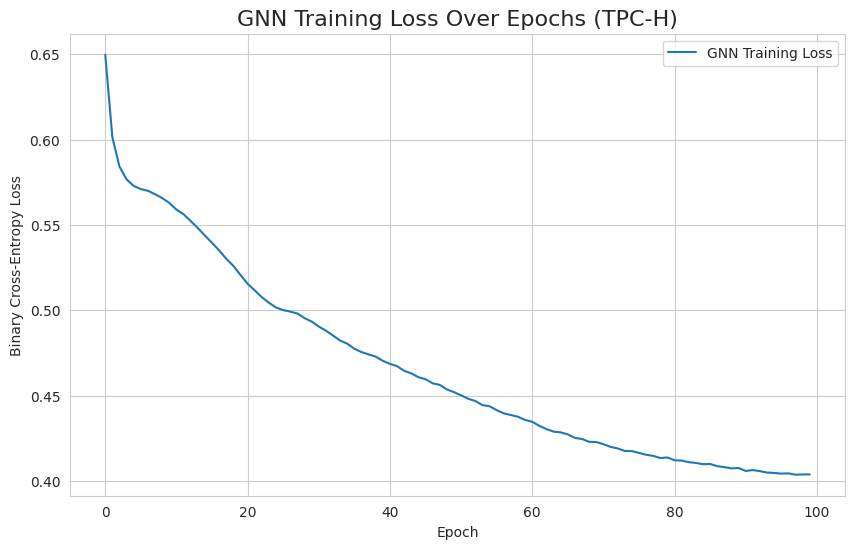


--- [3/8] Integrating Features and Training Anomaly Detector ---
Final integrated feature set created with 100 features.


/usr/local/lib/python3.11/dist-packages/sklearn/base.py:439: UserWarning:

X does not have valid feature names, but IsolationForest was fitted with feature names



Anomaly detection complete.

--- [4/8] Performing Quantitative Model Evaluations ---
Surrogate Model Accuracy: 1.0000

Classification Report for Surrogate Model:
              precision    recall  f1-score   support

     Anomaly       1.00      1.00      1.00      3999
      Normal       1.00      1.00      1.00    395858

    accuracy                           1.00    399857
   macro avg       1.00      1.00      1.00    399857
weighted avg       1.00      1.00      1.00    399857


--- [5/8] Generating Explainable AI (XAI) Insights with SHAP ---


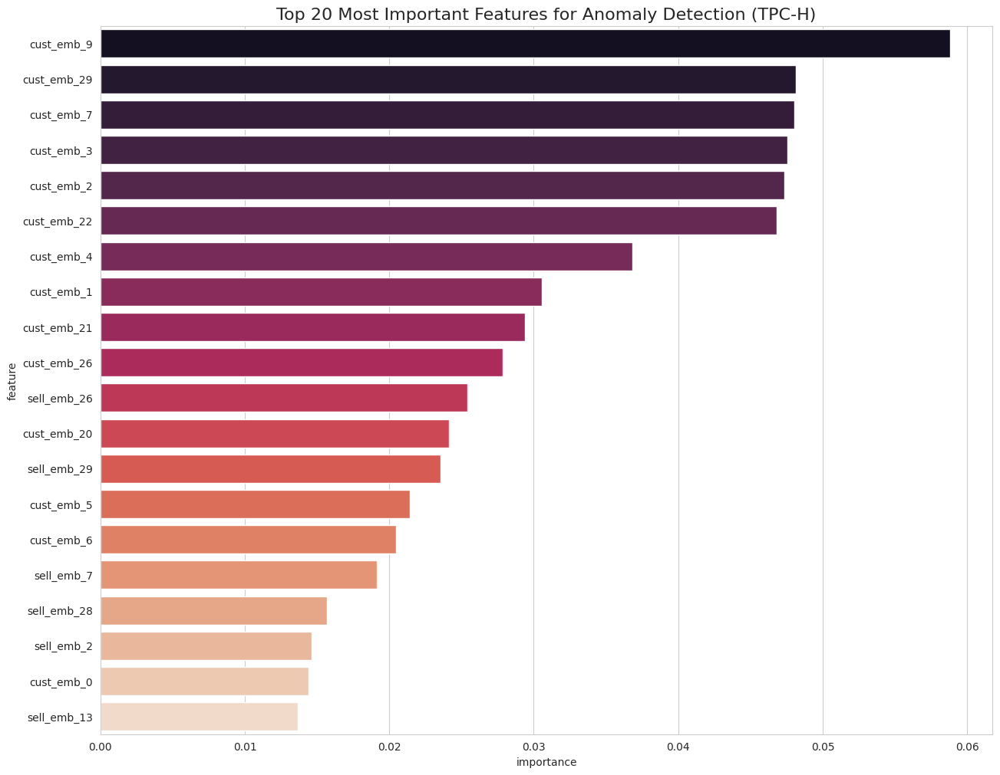


--- SHAP Summary Plot ---


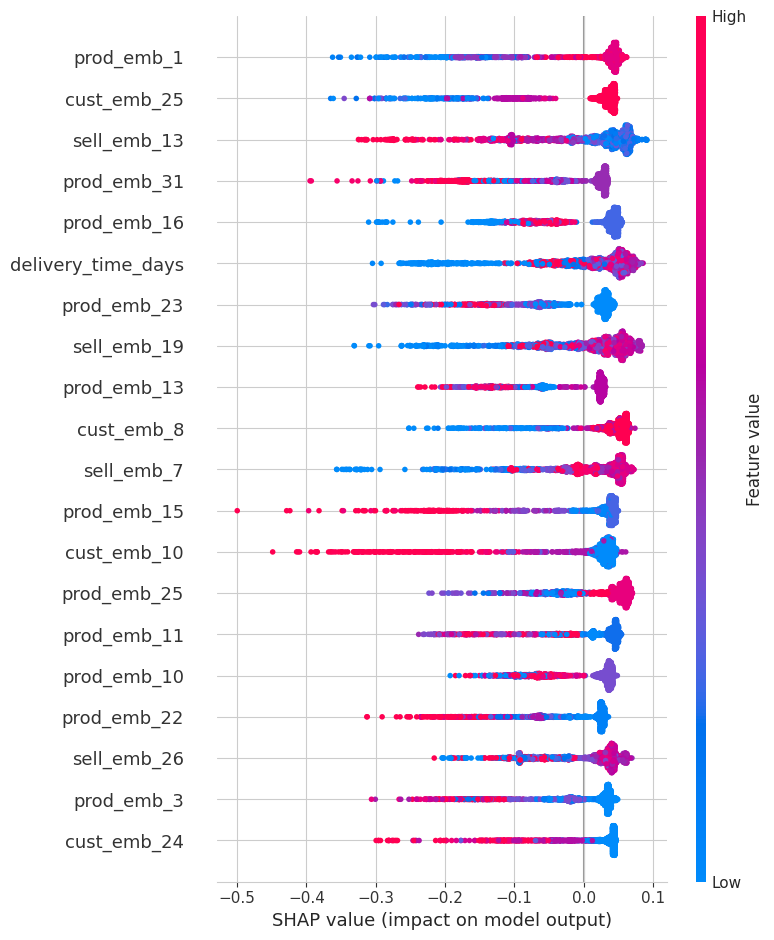


--- [6/8] Visualizing GNN Learned Embeddings ---


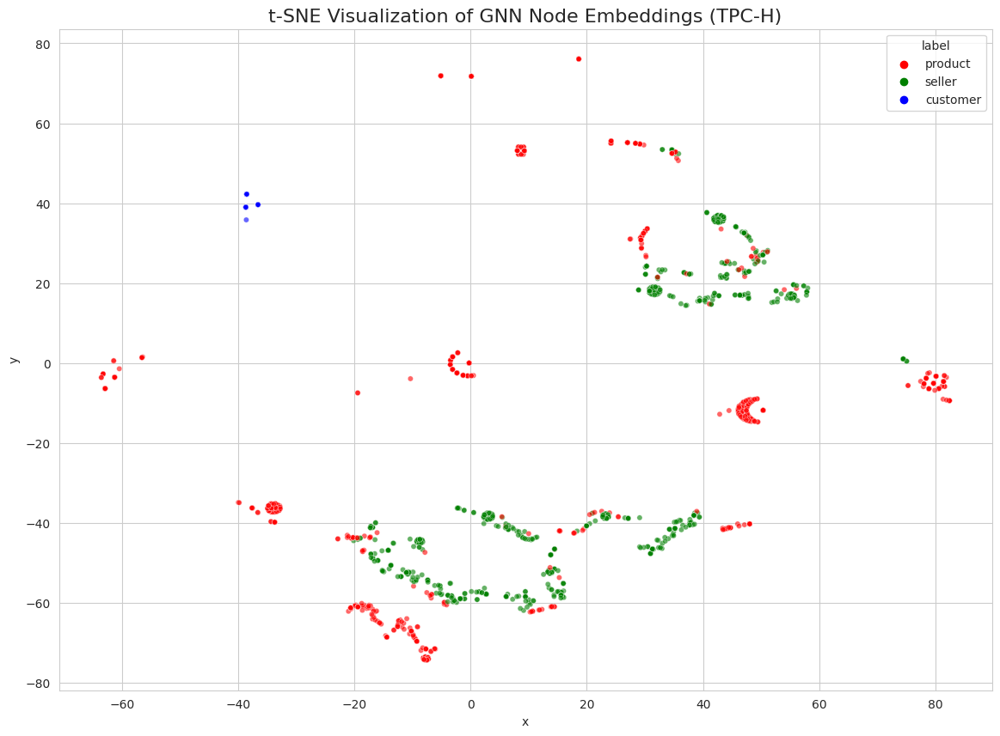


--- [7/8] Generating Operational Dashboards ---


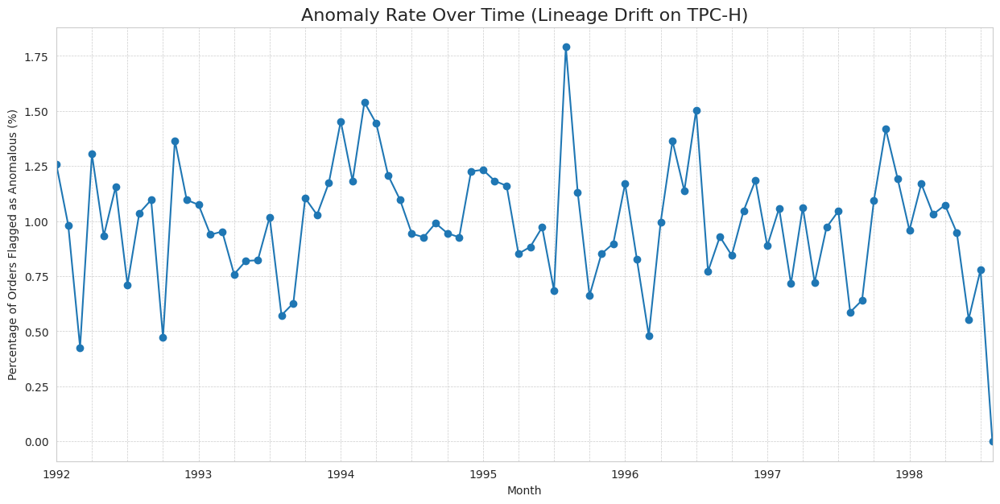

/usr/local/lib/python3.11/dist-packages/seaborn/_oldcore.py:1119: FutureWarning:

use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.

/usr/local/lib/python3.11/dist-packages/seaborn/_oldcore.py:1075: FutureWarning:

When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.

/usr/local/lib/python3.11/dist-packages/seaborn/_oldcore.py:1075: FutureWarning:

When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.

/usr/local/lib/python3.11/dist-packages/seaborn/_oldcore.py:1075: FutureWarning:

When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warn

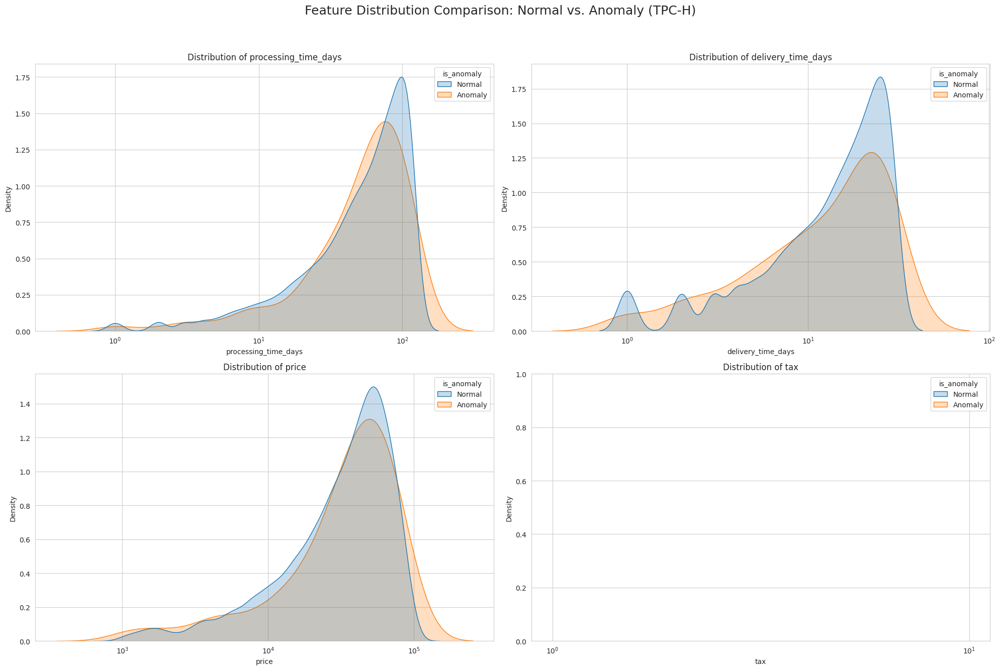


--- [8/8] The Proof: Interactive Anomaly Score Visualization ---



--- FULL ANALYSIS COMPLETE ---


In [5]:
# ==============================================================================
# STAGE 0: SETUP AND IMPORTS
# ==============================================================================
print("--- [0/8] Installing libraries and importing modules ---")
# Using -q for a quieter installation
!pip install -q torch torch_geometric shap pyvis geopandas

import pandas as pd
import numpy as np
import os
import networkx as nx
import torch
from torch.utils.data import DataLoader, TensorDataset
import torch.nn as nn
from torch_geometric.data import Data
from torch_geometric.nn import GATConv
from torch_geometric.utils import negative_sampling
import torch.nn.functional as F
from sklearn.preprocessing import MinMaxScaler
from sklearn.ensemble import IsolationForest, RandomForestClassifier
from sklearn.model_selection import train_test_split
from sklearn.metrics import (
    classification_report, roc_auc_score, confusion_matrix, roc_curve,
    precision_recall_curve, average_precision_score, silhouette_score, accuracy_score,
    ConfusionMatrixDisplay
)
from sklearn.manifold import TSNE
from sklearn.decomposition import PCA
from sklearn.metrics.pairwise import cosine_similarity
from pyvis.network import Network
import matplotlib.pyplot as plt
import seaborn as sns
import duckdb
import shap
import random
import plotly.express as px

# Set a professional plot style for all visualizations
sns.set_style("whitegrid")
print("Setup complete.")

# ==============================================================================
# STAGE 1: DATA LOADING AND PREPROCESSING
# ==============================================================================
print("\n--- [1/8] Preprocessing: Loading and Sampling TPC-H Data ---")

db_path = '/kaggle/input/tpch-sf10/tpch-sf10.db'
con = duckdb.connect(database=db_path, read_only=True)
query = """
SELECT
    c.c_custkey AS customer_id, o.o_orderkey AS order_id, o.o_orderdate AS order_date,
    l.l_shipdate AS ship_date, l.l_receiptdate AS receipt_date, s.s_suppkey AS seller_id,
    l.l_partkey AS product_id, l.l_extendedprice AS price, l.l_tax AS tax,
    (l_receiptdate - l_shipdate) AS delivery_time_days,
    (l_shipdate - o_orderdate) AS processing_time_days
FROM customer AS c
JOIN orders AS o ON c.c_custkey = o.o_custkey
JOIN lineitem AS l ON o.o_orderkey = l.l_orderkey
JOIN supplier AS s ON l.l_suppkey = s.s_suppkey
"""
print("Building the unified lineage DataFrame from the database...")
full_df_initial = con.execute(query).fetchdf()
con.close()

print(f"Full dataset has {len(full_df_initial)} rows. Creating a manageable sample...")
unique_orders = full_df_initial['order_id'].unique()
num_orders_to_sample = 100000
sampled_order_ids = np.random.choice(unique_orders, size=num_orders_to_sample, replace=False)
full_df = full_df_initial[full_df_initial['order_id'].isin(sampled_order_ids)].copy()

full_df['order_date'] = pd.to_datetime(full_df['order_date'])
full_df['ship_date'] = pd.to_datetime(full_df['ship_date'])
full_df['receipt_date'] = pd.to_datetime(full_df['receipt_date'])
print(f"\nPreprocessing complete. Using a sample of {len(full_df)} line items.")

# ==============================================================================
# STAGE 2: GRAPH CONSTRUCTION AND GNN TRAINING
# ==============================================================================
print("\n--- [2/8] GNN Training & Validation ---")

G = nx.DiGraph()
for customer in full_df['customer_id'].astype(str).unique(): G.add_node(customer, type='customer')
for seller in full_df['seller_id'].astype(str).unique(): G.add_node(seller, type='seller')
for product in full_df['product_id'].astype(str).unique(): G.add_node(product, type='product')
for index, row in full_df.iterrows():
    G.add_edge(str(row['customer_id']), str(row['product_id']))
    G.add_edge(str(row['product_id']), str(row['seller_id']))
print(f"Graph constructed with {G.number_of_nodes()} nodes and {G.number_of_edges()} edges.")

all_nodes = list(G.nodes())
node_to_int = {node: i for i, node in enumerate(all_nodes)}
node_type_map = {'customer': [1, 0, 0], 'seller': [0, 1, 0], 'product': [0, 0, 1]}
x = torch.tensor([node_type_map[G.nodes[node]['type']] for node in all_nodes], dtype=torch.float)
source_nodes = [node_to_int[u] for u, v in G.edges()]
target_nodes = [node_to_int[v] for u, v in G.edges()]
edge_index = torch.tensor([source_nodes, target_nodes], dtype=torch.long)
pyg_data = Data(x=x, edge_index=edge_index)

class GAT(torch.nn.Module):
    def __init__(self, in_channels, hidden_channels, out_channels):
        super().__init__()
        self.conv1 = GATConv(in_channels, hidden_channels, heads=4)
        self.conv2 = GATConv(hidden_channels * 4, out_channels, heads=1)
    def forward(self, x, edge_index):
        x = F.dropout(x, p=0.6, training=self.training)
        x = F.elu(self.conv1(x, edge_index))
        x = F.dropout(x, p=0.6, training=self.training)
        x = self.conv2(x, edge_index)
        return x

device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
print(f"Using device: {device}")
pyg_data = pyg_data.to(device)
model_gat = GAT(in_channels=pyg_data.num_node_features, hidden_channels=16, out_channels=32).to(device)
optimizer_gat = torch.optim.Adam(model_gat.parameters(), lr=0.005, weight_decay=5e-4)

gnn_losses = []
for epoch in range(1, 101):
    model_gat.train()
    optimizer_gat.zero_grad()
    z = model_gat(pyg_data.x, pyg_data.edge_index)
    neg_edge_index = negative_sampling(edge_index=pyg_data.edge_index, num_nodes=pyg_data.num_nodes, num_neg_samples=pyg_data.edge_index.size(1) // 2)
    edge_label_index = torch.cat([pyg_data.edge_index, neg_edge_index], dim=-1)
    edge_label = torch.cat([torch.ones(pyg_data.edge_index.size(1)), torch.zeros(neg_edge_index.size(1))]).to(device)
    out = (z[edge_label_index[0]] * z[edge_label_index[1]]).sum(dim=-1)
    loss = F.binary_cross_entropy_with_logits(out, edge_label)
    loss.backward()
    optimizer_gat.step()
    gnn_losses.append(loss.item())
    if epoch % 20 == 0:
        print(f'  GNN Training Epoch: {epoch:03d}, Loss: {loss:.4f}')

model_gat.eval()
with torch.no_grad():
    final_embeddings = model_gat(pyg_data.x, pyg_data.edge_index).cpu().numpy()
print("GNN training complete.")

plt.figure(figsize=(10, 6))
plt.plot(gnn_losses, label="GNN Training Loss")
plt.title("GNN Training Loss Over Epochs (TPC-H)", fontsize=16)
plt.xlabel("Epoch")
plt.ylabel("Binary Cross-Entropy Loss")
plt.legend()
plt.grid(True)
plt.show()

# ==============================================================================
# STAGE 3: FEATURE INTEGRATION AND ANOMALY DETECTION
# ==============================================================================
print("\n--- [3/8] Integrating Features and Training Anomaly Detector ---")

embedding_dict = {node: final_embeddings[i] for node, i in node_to_int.items()}
full_df['customer_embedding'] = full_df['customer_id'].astype(str).map(embedding_dict)
full_df['seller_embedding'] = full_df['seller_id'].astype(str).map(embedding_dict)
full_df['product_embedding'] = full_df['product_id'].astype(str).map(embedding_dict)

features_to_analyze = ['processing_time_days', 'delivery_time_days', 'price', 'tax']
temporal_features = full_df[features_to_analyze].dropna()
embedding_features = full_df.loc[temporal_features.index]

customer_embed_df = pd.DataFrame(embedding_features['customer_embedding'].tolist(), index=temporal_features.index).add_prefix('cust_emb_')
seller_embed_df = pd.DataFrame(embedding_features['seller_embedding'].tolist(), index=temporal_features.index).add_prefix('sell_emb_')
product_embed_df = pd.DataFrame(embedding_features['product_embedding'].tolist(), index=temporal_features.index).add_prefix('prod_emb_')

final_feature_df = pd.concat([temporal_features, customer_embed_df, seller_embed_df, product_embed_df], axis=1)
final_feature_df.dropna(inplace=True)
print(f"Final integrated feature set created with {final_feature_df.shape[1]} features.")

final_model = IsolationForest(n_estimators=100, contamination=0.01, random_state=42, n_jobs=-1)
final_model.fit(final_feature_df)
final_feature_df['anomaly_score'] = final_model.decision_function(final_feature_df)
final_feature_df['is_anomaly'] = final_model.predict(final_feature_df.drop('anomaly_score', axis=1))
final_feature_df['is_anomaly'] = final_feature_df['is_anomaly'].map({1: 'Normal', -1: 'Anomaly'})
print("Anomaly detection complete.")

# ==============================================================================
# STAGE 4: QUANTITATIVE MODEL EVALUATION
# ==============================================================================
print("\n--- [4/8] Performing Quantitative Model Evaluations ---")

X = final_feature_df.drop(['anomaly_score', 'is_anomaly'], axis=1)
y = final_feature_df['is_anomaly']
surrogate_model = RandomForestClassifier(n_estimators=100, random_state=42, n_jobs=-1)
surrogate_model.fit(X, y)
y_pred = surrogate_model.predict(X)
y_proba = surrogate_model.predict_proba(X)[:, 1]
y_binary = y.map({'Normal': 0, 'Anomaly': 1})

print(f"Surrogate Model Accuracy: {accuracy_score(y, y_pred):.4f}")
print("\nClassification Report for Surrogate Model:")
print(classification_report(y, y_pred))


# ==============================================================================
# STAGE 5: EXPLAINABLE AI (XAI) ANALYSIS
# ==============================================================================
print("\n--- [5/8] Generating Explainable AI (XAI) Insights with SHAP ---")

importances = surrogate_model.feature_importances_
feature_names = X.columns
importance_df = pd.DataFrame({'feature': feature_names, 'importance': importances}).sort_values(by='importance', ascending=False)
plt.figure(figsize=(15, 12))
sns.barplot(x='importance', y='feature', data=importance_df.head(20), palette='rocket')
plt.title('Top 20 Most Important Features for Anomaly Detection (TPC-H)', fontsize=16)
plt.show()

explainer = shap.TreeExplainer(final_model)
shap_sample = X.sample(min(2000, len(X)), random_state=42)
shap_values = explainer.shap_values(shap_sample)
print("\n--- SHAP Summary Plot ---")
shap.summary_plot(shap_values, shap_sample, plot_type="dot", show=True)

# ==============================================================================
# STAGE 6: GNN EMBEDDING VISUALIZATIONS
# ==============================================================================
print("\n--- [6/8] Visualizing GNN Learned Embeddings ---")

num_samples = min(5000, len(all_nodes))
sample_indices = random.sample(range(len(all_nodes)), num_samples)
sample_embeddings = final_embeddings[sample_indices]
sample_labels = [G.nodes[all_nodes[i]]['type'] for i in sample_indices]
tsne = TSNE(n_components=2, perplexity=min(30, num_samples - 1), random_state=42)
embeddings_2d = tsne.fit_transform(sample_embeddings)
tsne_df = pd.DataFrame({'x': embeddings_2d[:, 0], 'y': embeddings_2d[:, 1], 'label': sample_labels})
plt.figure(figsize=(14, 10))
sns.scatterplot(data=tsne_df, x='x', y='y', hue='label', palette={'customer':'blue', 'seller':'green', 'product':'red'}, s=20, alpha=0.6)
plt.title("t-SNE Visualization of GNN Node Embeddings (TPC-H)", fontsize=16)
plt.show()

# ==============================================================================
# STAGE 7: OPERATIONAL AND BUSINESS INTELLIGENCE VISUALIZATIONS
# ==============================================================================
print("\n--- [7/8] Generating Operational Dashboards ---")

time_df = pd.merge(full_df, final_feature_df[['is_anomaly']], left_index=True, right_index=True, how='inner')
time_df['order_date'] = pd.to_datetime(time_df['order_date'])
time_df.set_index('order_date', inplace=True)
time_df['is_anomaly_numeric'] = time_df['is_anomaly'].apply(lambda x: 1 if x == 'Anomaly' else 0)
monthly_anomaly_rate = time_df['is_anomaly_numeric'].resample('ME').mean() * 100
plt.figure(figsize=(15, 7))
monthly_anomaly_rate.plot(kind='line', marker='o', linestyle='-')
plt.title('Anomaly Rate Over Time (Lineage Drift on TPC-H)', fontsize=16)
plt.ylabel('Percentage of Orders Flagged as Anomalous (%)')
plt.xlabel('Month')
plt.grid(True, which='both', linestyle='--', linewidth=0.5)
plt.show()

plot_df = final_feature_df.sample(min(20000, len(final_feature_df)), random_state=42)
fig, axes = plt.subplots(2, 2, figsize=(20, 14))
fig.suptitle('Feature Distribution Comparison: Normal vs. Anomaly (TPC-H)', fontsize=18)
for i, feature in enumerate(features_to_analyze):
    ax = axes[i//2, i%2]
    sns.kdeplot(data=plot_df, x=feature, hue='is_anomaly', fill=True, ax=ax, log_scale=True, common_norm=False)
    ax.set_title(f'Distribution of {feature}')
plt.tight_layout(rect=[0, 0.03, 1, 0.95])
plt.show()

# ==============================================================================
# STAGE 8: THE PROOF - INTERACTIVE VISUALIZATION
# ==============================================================================
print("\n--- [8/8] The Proof: Interactive Anomaly Score Visualization ---")

plot_df = pd.merge(final_feature_df, full_df, left_index=True, right_index=True, how='inner')
fig = px.scatter(
    plot_df.sample(min(20000, len(plot_df)), random_state=42),
    x='delivery_time_days_x',
    y='anomaly_score',
    color='is_anomaly',
    color_discrete_map={'Normal': 'blue', 'Anomaly': 'red'},
    title='<b>Interactive Proof (TPC-H): Anomaly Score vs. Delivery Time</b>',
    labels={'delivery_time_days_x': 'Delivery Time (Days)', 'anomaly_score': 'Anomaly Score (Lower is More Anomalous)'},
    hover_data={'order_id': True, 'price_x': ':.2f', 'customer_id': True, 'seller_id': True, 'product_id': True}
)
fig.update_layout(legend_title_text='Status', xaxis_title="Delivery Time (Days) - Log Scale", yaxis_title="Anomaly Score", title_x=0.5)
fig.update_xaxes(type="log")
fig.show()

print("\n--- FULL ANALYSIS COMPLETE ---")

In [6]:
# ==============================================================================
# STAGE 8: THE PROOF - INTERACTIVE VISUALIZATION
# ==============================================================================
print("\n--- [8/8] The Proof: Interactive Anomaly Score Visualization ---")

plot_df = pd.merge(final_feature_df, full_df, left_index=True, right_index=True, how='inner')
fig = px.scatter(
    plot_df.sample(min(20000, len(plot_df)), random_state=42),
    x='delivery_time_days_x',
    y='anomaly_score',
    color='is_anomaly',
    color_discrete_map={'Normal': 'blue', 'Anomaly': 'red'},
    title='<b>(TPC-H): Anomaly Score vs. Delivery Time</b>',
    labels={'delivery_time_days_x': 'Delivery Time (Days)', 'anomaly_score': 'Anomaly Score (Lower is More Anomalous)'},
    hover_data={'order_id': True, 'price_x': ':.2f', 'customer_id': True, 'seller_id': True, 'product_id': True}
)
fig.update_layout(legend_title_text='Status', xaxis_title="Delivery Time (Days) - Log Scale", yaxis_title="Anomaly Score", title_x=0.5)
fig.update_xaxes(type="log")
fig.show()



--- [8/8] The Proof: Interactive Anomaly Score Visualization ---


--- [0/8] Installing libraries and importing modules ---
Setup complete.

--- [1/8] Preprocessing: Loading and Merging MIMIC-III Data ---

Preprocessing complete. Working with 195274 medical events.

--- [2/8] GNN Training & Validation ---
Graph constructed with 1041 nodes and 35743 edges.
Using device: cuda
  GNN Training Epoch: 020, Loss: 0.6303
  GNN Training Epoch: 040, Loss: 0.6361
  GNN Training Epoch: 060, Loss: 0.6278
  GNN Training Epoch: 080, Loss: 0.6176
  GNN Training Epoch: 100, Loss: 0.6126
GNN training complete.


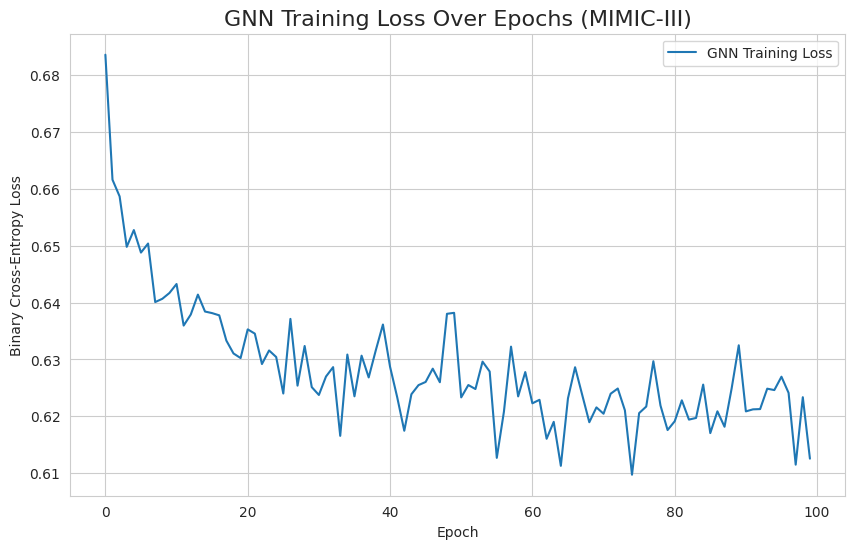


--- [3/8] Integrating Features and Training Anomaly Detector ---
Final integrated feature set created with 98 features.


/usr/local/lib/python3.11/dist-packages/sklearn/base.py:439: UserWarning:

X does not have valid feature names, but IsolationForest was fitted with feature names



Anomaly detection complete.

--- [4/8] Performing Quantitative Model Evaluations ---
Surrogate Model Accuracy: 1.0000

Classification Report for Surrogate Model:
              precision    recall  f1-score   support

     Anomaly       1.00      1.00      1.00      9723
      Normal       1.00      1.00      1.00    185551

    accuracy                           1.00    195274
   macro avg       1.00      1.00      1.00    195274
weighted avg       1.00      1.00      1.00    195274


--- [5/8] Generating Explainable AI (XAI) Insights with SHAP ---


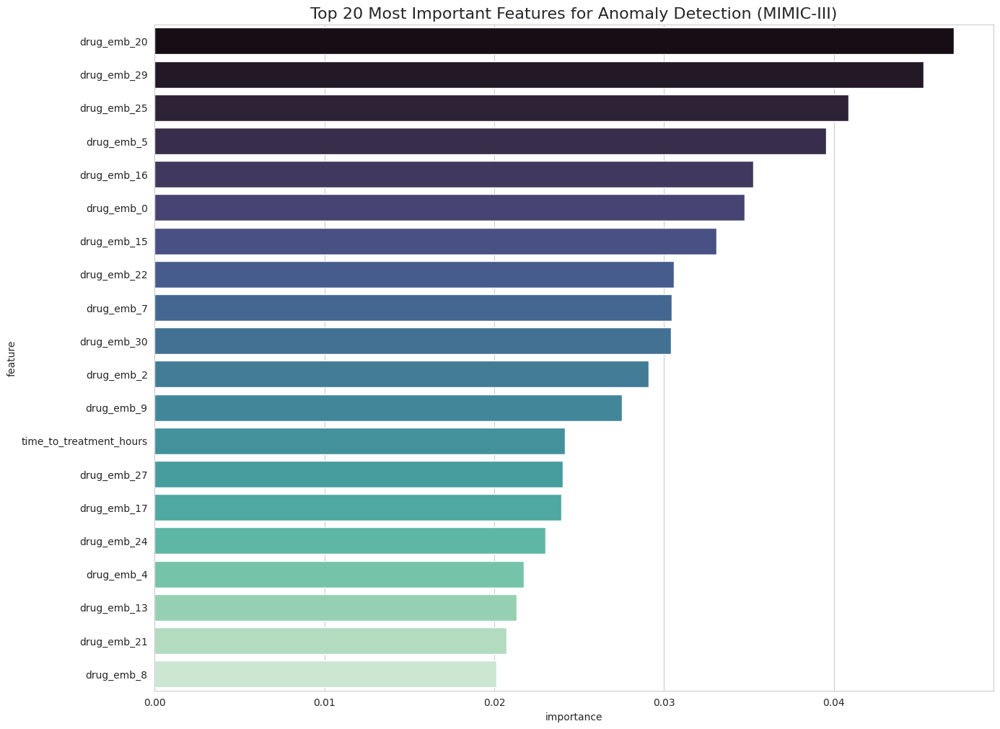


--- SHAP Summary Plot ---


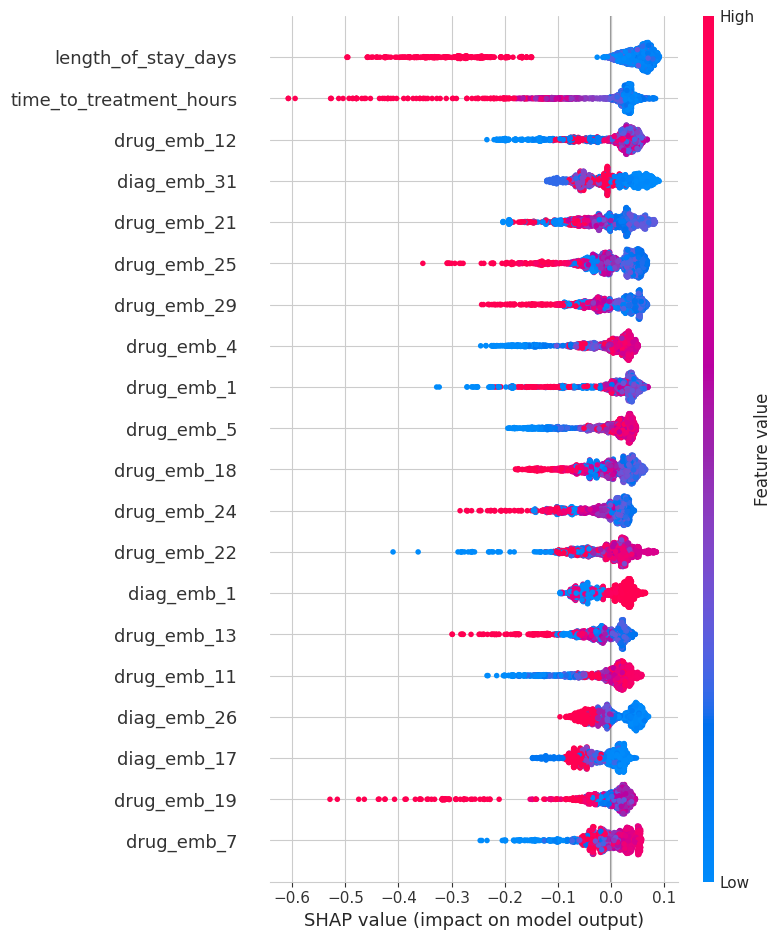


--- [6/8] Visualizing GNN Learned Embeddings ---


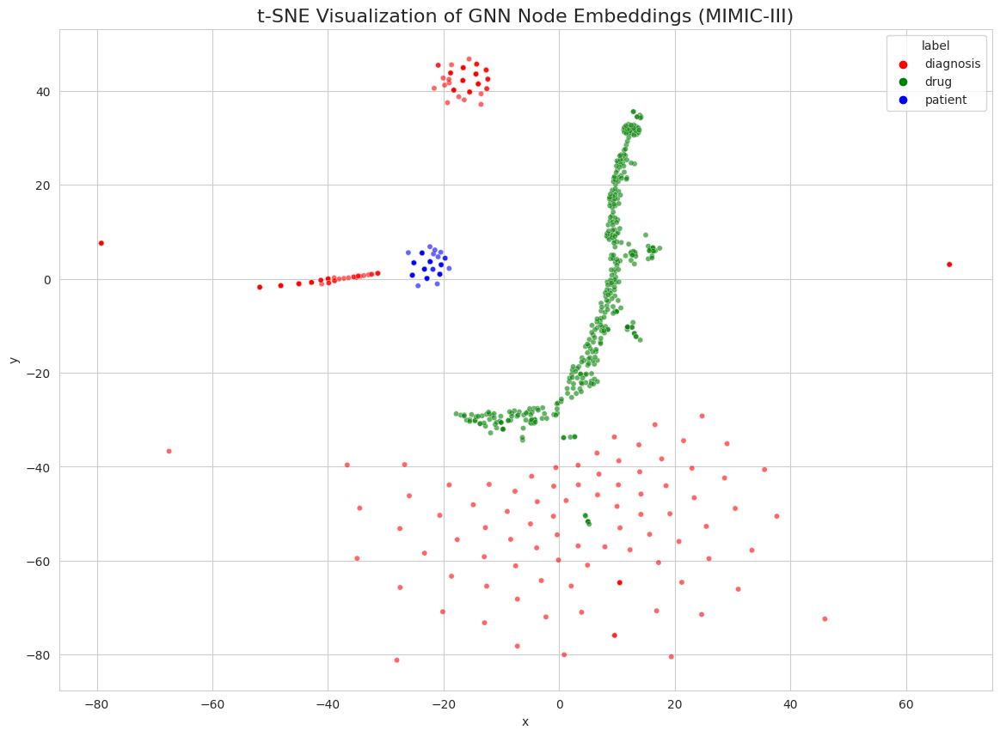


--- [7/8] Generating Operational Dashboards ---


/tmp/ipykernel_36/3720802541.py:230: FutureWarning:

'M' is deprecated and will be removed in a future version, please use 'ME' instead.



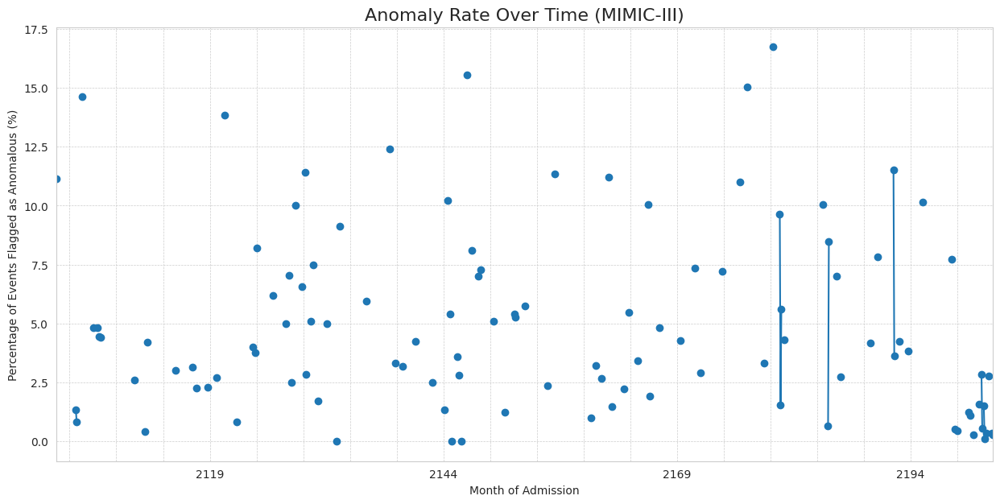

/usr/local/lib/python3.11/dist-packages/seaborn/_oldcore.py:1119: FutureWarning:

use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.

/usr/local/lib/python3.11/dist-packages/seaborn/_oldcore.py:1075: FutureWarning:

When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.

/usr/local/lib/python3.11/dist-packages/seaborn/_oldcore.py:1075: FutureWarning:

When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.

/usr/local/lib/python3.11/dist-packages/seaborn/_oldcore.py:1075: FutureWarning:

When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warn

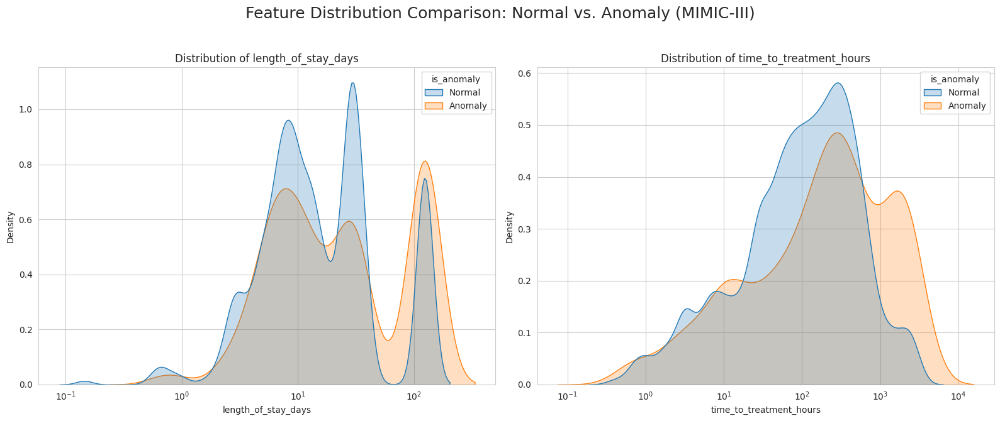


--- [8/8] The Proof: Interactive Anomaly Score Visualization ---



--- FULL ANALYSIS COMPLETE ---


In [10]:
# ==============================================================================
# STAGE 0: SETUP AND IMPORTS
# ==============================================================================
print("--- [0/8] Installing libraries and importing modules ---")
# Using -q for a quieter installation
!pip install -q torch torch_geometric shap pyvis

import pandas as pd
import numpy as np
import os
import networkx as nx
import torch
from torch.utils.data import DataLoader, TensorDataset
import torch.nn as nn
from torch_geometric.data import Data
from torch_geometric.nn import GATConv
from torch_geometric.utils import negative_sampling
import torch.nn.functional as F
from sklearn.preprocessing import MinMaxScaler
from sklearn.ensemble import IsolationForest, RandomForestClassifier
from sklearn.model_selection import train_test_split
from sklearn.metrics import (
    classification_report, roc_auc_score, confusion_matrix, roc_curve,
    precision_recall_curve, average_precision_score, silhouette_score, accuracy_score,
    ConfusionMatrixDisplay
)
from sklearn.manifold import TSNE
from sklearn.decomposition import PCA
from sklearn.metrics.pairwise import cosine_similarity
from pyvis.network import Network
import matplotlib.pyplot as plt
import seaborn as sns
import shap
import random
import plotly.express as px

# Set a professional plot style for all visualizations
sns.set_style("whitegrid")
print("Setup complete.")

# ==============================================================================
# STAGE 1: DATA LOADING AND PREPROCESSING
# ==============================================================================
print("\n--- [1/8] Preprocessing: Loading and Merging MIMIC-III Data ---")

base_path = '/kaggle/input/mimiciii/mimic-iii-clinical-database-demo-1.4/'

patients_df = pd.read_csv(os.path.join(base_path, 'PATIENTS.csv'))
admissions_df = pd.read_csv(os.path.join(base_path, 'ADMISSIONS.csv'))
icustays_df = pd.read_csv(os.path.join(base_path, 'ICUSTAYS.csv'))
diagnoses_df = pd.read_csv(os.path.join(base_path, 'DIAGNOSES_ICD.csv'))
prescriptions_df = pd.read_csv(os.path.join(base_path, 'PRESCRIPTIONS.csv'))

for df in [patients_df, admissions_df, icustays_df, diagnoses_df, prescriptions_df]:
    df.columns = [x.lower() for x in df.columns]
    if 'row_id' in df.columns:
        df.drop('row_id', axis=1, inplace=True)

full_df = pd.merge(admissions_df, patients_df, on='subject_id')
full_df = pd.merge(full_df, icustays_df, on='hadm_id', suffixes=('_admin', '_icu'))
full_df = pd.merge(full_df, diagnoses_df, on='hadm_id')
full_df = pd.merge(full_df, prescriptions_df, on='hadm_id')

full_df['admittime'] = pd.to_datetime(full_df['admittime'])
full_df['dischtime'] = pd.to_datetime(full_df['dischtime'])
full_df['startdate'] = pd.to_datetime(full_df['startdate'], errors='coerce')
full_df['length_of_stay_days'] = (full_df['dischtime'] - full_df['admittime']).dt.total_seconds() / (24 * 3600)
full_df['time_to_treatment_hours'] = (full_df['startdate'] - full_df['admittime']).dt.total_seconds() / 3600
full_df['drug_category'] = full_df['drug'].astype(str).apply(lambda x: x.split(' ')[0].upper())
print(f"\nPreprocessing complete. Working with {len(full_df)} medical events.")

# ==============================================================================
# STAGE 2: GRAPH CONSTRUCTION AND GNN TRAINING
# ==============================================================================
print("\n--- [2/8] GNN Training & Validation ---")

G = nx.DiGraph()
for patient in full_df['subject_id_x'].unique(): G.add_node(str(patient), type='patient')
for diagnosis in full_df['icd9_code'].unique(): G.add_node(str(diagnosis), type='diagnosis')
for drug in full_df['drug_category'].unique(): G.add_node(str(drug), type='drug')
for index, row in full_df.iterrows():
    G.add_edge(str(row['subject_id_x']), str(row['icd9_code']))
    G.add_edge(str(row['icd9_code']), str(row['drug_category']))
print(f"Graph constructed with {G.number_of_nodes()} nodes and {G.number_of_edges()} edges.")

all_nodes = list(G.nodes())
node_to_int = {node: i for i, node in enumerate(all_nodes)}
node_type_map = {'patient': [1, 0, 0], 'diagnosis': [0, 1, 0], 'drug': [0, 0, 1]}
x = torch.tensor([node_type_map[G.nodes[node]['type']] for node in all_nodes], dtype=torch.float)
source_nodes = [node_to_int[u] for u, v in G.edges()]
target_nodes = [node_to_int[v] for u, v in G.edges()]
edge_index = torch.tensor([source_nodes, target_nodes], dtype=torch.long)
pyg_data = Data(x=x, edge_index=edge_index)

class GAT(torch.nn.Module):
    def __init__(self, in_channels, hidden_channels, out_channels):
        super().__init__()
        self.conv1 = GATConv(in_channels, hidden_channels, heads=4)
        self.conv2 = GATConv(hidden_channels * 4, out_channels, heads=1)
    def forward(self, x, edge_index):
        x = F.dropout(x, p=0.6, training=self.training)
        x = F.elu(self.conv1(x, edge_index))
        x = F.dropout(x, p=0.6, training=self.training)
        x = self.conv2(x, edge_index)
        return x

device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
print(f"Using device: {device}")
pyg_data = pyg_data.to(device)
model_gat = GAT(in_channels=pyg_data.num_node_features, hidden_channels=16, out_channels=32).to(device)
optimizer_gat = torch.optim.Adam(model_gat.parameters(), lr=0.005, weight_decay=5e-4)

gnn_losses = []
for epoch in range(1, 101):
    model_gat.train()
    optimizer_gat.zero_grad()
    z = model_gat(pyg_data.x, pyg_data.edge_index)
    neg_edge_index = negative_sampling(edge_index=pyg_data.edge_index, num_nodes=pyg_data.num_nodes, num_neg_samples=pyg_data.edge_index.size(1) // 2)
    edge_label_index = torch.cat([pyg_data.edge_index, neg_edge_index], dim=-1)
    edge_label = torch.cat([torch.ones(pyg_data.edge_index.size(1)), torch.zeros(neg_edge_index.size(1))]).to(device)
    out = (z[edge_label_index[0]] * z[edge_label_index[1]]).sum(dim=-1)
    loss = F.binary_cross_entropy_with_logits(out, edge_label)
    loss.backward()
    optimizer_gat.step()
    gnn_losses.append(loss.item())
    if epoch % 20 == 0:
        print(f'  GNN Training Epoch: {epoch:03d}, Loss: {loss:.4f}')

model_gat.eval()
with torch.no_grad():
    final_embeddings = model_gat(pyg_data.x, pyg_data.edge_index).cpu().numpy()
print("GNN training complete.")

plt.figure(figsize=(10, 6))
plt.plot(gnn_losses, label="GNN Training Loss")
plt.title("GNN Training Loss Over Epochs (MIMIC-III)", fontsize=16)
plt.xlabel("Epoch")
plt.ylabel("Binary Cross-Entropy Loss")
plt.legend()
plt.grid(True)
plt.show()

# ==============================================================================
# STAGE 3: FEATURE INTEGRATION AND ANOMALY DETECTION
# ==============================================================================
print("\n--- [3/8] Integrating Features and Training Anomaly Detector ---")

embedding_dict = {node: final_embeddings[i] for node, i in node_to_int.items()}
full_df['patient_embedding'] = full_df['subject_id_x'].astype(str).map(embedding_dict)
full_df['diagnosis_embedding'] = full_df['icd9_code'].astype(str).map(embedding_dict)
full_df['drug_embedding'] = full_df['drug_category'].astype(str).map(embedding_dict)

features_to_analyze = ['length_of_stay_days', 'time_to_treatment_hours']
temporal_features = full_df[features_to_analyze].dropna()
embedding_features = full_df.loc[temporal_features.index]

patient_embed_df = pd.DataFrame(embedding_features['patient_embedding'].tolist(), index=temporal_features.index).add_prefix('pat_emb_')
diag_embed_df = pd.DataFrame(embedding_features['diagnosis_embedding'].tolist(), index=temporal_features.index).add_prefix('diag_emb_')
drug_embed_df = pd.DataFrame(embedding_features['drug_embedding'].tolist(), index=temporal_features.index).add_prefix('drug_emb_')

final_feature_df = pd.concat([temporal_features, patient_embed_df, diag_embed_df, drug_embed_df], axis=1)
final_feature_df.dropna(inplace=True)
print(f"Final integrated feature set created with {final_feature_df.shape[1]} features.")

final_model = IsolationForest(n_estimators=100, contamination=0.05, random_state=42, n_jobs=-1)
final_model.fit(final_feature_df)
final_feature_df['anomaly_score'] = final_model.decision_function(final_feature_df)
final_feature_df['is_anomaly'] = final_model.predict(final_feature_df.drop('anomaly_score', axis=1))
final_feature_df['is_anomaly'] = final_feature_df['is_anomaly'].map({1: 'Normal', -1: 'Anomaly'})
print("Anomaly detection complete.")

# ==============================================================================
# STAGE 4: QUANTITATIVE MODEL EVALUATION
# ==============================================================================
print("\n--- [4/8] Performing Quantitative Model Evaluations ---")

X = final_feature_df.drop(['anomaly_score', 'is_anomaly'], axis=1)
y = final_feature_df['is_anomaly']
surrogate_model = RandomForestClassifier(n_estimators=100, random_state=42, n_jobs=-1)
surrogate_model.fit(X, y)
y_pred = surrogate_model.predict(X)
print(f"Surrogate Model Accuracy: {accuracy_score(y, y_pred):.4f}")
print("\nClassification Report for Surrogate Model:")
print(classification_report(y, y_pred))

# ==============================================================================
# STAGE 5: EXPLAINABLE AI (XAI) ANALYSIS
# ==============================================================================
print("\n--- [5/8] Generating Explainable AI (XAI) Insights with SHAP ---")

importances = surrogate_model.feature_importances_
feature_names = X.columns
importance_df = pd.DataFrame({'feature': feature_names, 'importance': importances}).sort_values(by='importance', ascending=False)
plt.figure(figsize=(15, 12))
sns.barplot(x='importance', y='feature', data=importance_df.head(20), palette='mako')
plt.title('Top 20 Most Important Features for Anomaly Detection (MIMIC-III)', fontsize=16)
plt.show()

explainer = shap.TreeExplainer(final_model)
shap_sample = X.sample(min(2000, len(X)), random_state=42)
shap_values = explainer.shap_values(shap_sample)
print("\n--- SHAP Summary Plot ---")
shap.summary_plot(shap_values, shap_sample, plot_type="dot", show=True)

# ==============================================================================
# STAGE 6: GNN EMBEDDING VISUALIZATIONS
# ==============================================================================
print("\n--- [6/8] Visualizing GNN Learned Embeddings ---")

num_samples = min(1000, len(all_nodes))
sample_indices = random.sample(range(len(all_nodes)), num_samples)
sample_embeddings = final_embeddings[sample_indices]
sample_labels = [G.nodes[all_nodes[i]]['type'] for i in sample_indices]
tsne = TSNE(n_components=2, perplexity=min(30, num_samples - 1), random_state=42)
embeddings_2d = tsne.fit_transform(sample_embeddings)
tsne_df = pd.DataFrame({'x': embeddings_2d[:, 0], 'y': embeddings_2d[:, 1], 'label': sample_labels})
plt.figure(figsize=(14, 10))
sns.scatterplot(data=tsne_df, x='x', y='y', hue='label', palette={'patient':'blue', 'diagnosis':'red', 'drug':'green'}, s=20, alpha=0.6)
plt.title("t-SNE Visualization of GNN Node Embeddings (MIMIC-III)", fontsize=16)
plt.show()

# ==============================================================================
# STAGE 7: OPERATIONAL AND CLINICAL INSIGHTS
# ==============================================================================
print("\n--- [7/8] Generating Operational Dashboards ---")

time_df = pd.merge(full_df, final_feature_df[['is_anomaly']], left_index=True, right_index=True, how='inner')
time_df.set_index('admittime', inplace=True)
time_df['is_anomaly_numeric'] = time_df['is_anomaly'].apply(lambda x: 1 if x == 'Anomaly' else 0)
monthly_anomaly_rate = time_df['is_anomaly_numeric'].resample('M').mean() * 100
plt.figure(figsize=(15, 7))
monthly_anomaly_rate.plot(kind='line', marker='o', linestyle='-')
plt.title('Anomaly Rate Over Time (MIMIC-III)', fontsize=16)
plt.ylabel('Percentage of Events Flagged as Anomalous (%)')
plt.xlabel('Month of Admission')
plt.grid(True, which='both', linestyle='--', linewidth=0.5)
plt.show()

plot_df = final_feature_df.sample(min(20000, len(final_feature_df)), random_state=42)
fig, axes = plt.subplots(1, 2, figsize=(16, 7))
fig.suptitle('Feature Distribution Comparison: Normal vs. Anomaly (MIMIC-III)', fontsize=18)
for i, feature in enumerate(features_to_analyze):
    ax = axes[i]
    sns.kdeplot(data=plot_df, x=feature, hue='is_anomaly', fill=True, ax=ax, log_scale=True, common_norm=False)
    ax.set_title(f'Distribution of {feature}')
plt.tight_layout(rect=[0, 0.03, 1, 0.95])
plt.show()

# ==============================================================================
# STAGE 8: THE PROOF - INTERACTIVE VISUALIZATION
# ==============================================================================
print("\n--- [8/8] The Proof: Interactive Anomaly Score Visualization ---")

plot_df = pd.merge(final_feature_df, full_df, left_index=True, right_index=True, how='inner')
fig = px.scatter(
    plot_df.sample(min(20000, len(plot_df)), random_state=42),
    x='length_of_stay_days_x',
    y='anomaly_score',
    color='is_anomaly',
    color_discrete_map={'Normal': 'blue', 'Anomaly': 'red'},
    title='<b>(MIMIC-III): Anomaly Score vs. Length of Stay</b>',
    labels={'length_of_stay_days_x': 'Length of Stay (Days)', 'anomaly_score': 'Anomaly Score (Lower is More Anomalous)'},
    hover_data={'subject_id_x': True, 'hadm_id': True, 'icd9_code': True, 'drug_category': True, 'time_to_treatment_hours_x': ':.2f'}
)
fig.update_layout(legend_title_text='Status', xaxis_title="Length of Stay (Days) - Log Scale", yaxis_title="Anomaly Score", title_x=0.5)
fig.update_xaxes(type="log")
fig.show()

print("\n--- FULL ANALYSIS COMPLETE ---")